In [1]:
# CELL 1: Import thư viện
import os
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from tqdm import tqdm

# Hiển thị đẹp hơn
plt.style.use("seaborn-v0_8")
plt.rcParams["figure.figsize"] = (10, 6)

# Đường dẫn gốc
TRAIN_CSV = os.path.join("data/train.csv")
TRAIN_IMG_DIR = os.path.join("data/train_images")


In [2]:
# CELL: Việt hóa tên các loại bệnh

label_map = {
    "bacterial_leaf_blight": "Bệnh bạc lá (vi khuẩn)",
    "bacterial_leaf_streak": "Bệnh sọc lá vi khuẩn",
    "bacterial_panicle_blight": "Bệnh thối bông vi khuẩn",
    "blast": "Bệnh đạo ôn",
    "brown_spot": "Bệnh đốm nâu",
    "dead_heart": "Bệnh chết tim",
    "downy_mildew": "Bệnh sương mai",
    "hispa": "Bệnh sâu hispa",
    "normal": "Lá khỏe mạnh",
    "tungro": "Bệnh vàng lùn (Tungro)"
}

In [3]:
# 1. TẢI DỮ LIỆU

df = pd.read_csv(TRAIN_CSV)
df["label_vi"] = df["label"].map(label_map).fillna(df["label"])

print("Đã tải train.csv với kích thước:", df.shape)
df.head()


Đã tải train.csv với kích thước: (10407, 5)


,image_id,label,variety,age,label_vi
0,100330.jpg,bacterial_leaf_blight,ADT45,45,Bệnh bạc lá (vi khuẩn)
1,100365.jpg,bacterial_leaf_blight,ADT45,45,Bệnh bạc lá (vi khuẩn)
2,100382.jpg,bacterial_leaf_blight,ADT45,45,Bệnh bạc lá (vi khuẩn)
3,100632.jpg,bacterial_leaf_blight,ADT45,45,Bệnh bạc lá (vi khuẩn)
4,101918.jpg,bacterial_leaf_blight,ADT45,45,Bệnh bạc lá (vi khuẩn)


In [4]:
# Số lượng giống lúa
num_varieties = df["variety"].nunique()
print("Số lượng giống lúa trong dataset:", num_varieties)

# Bảng số lượng mẫu theo giống lúa
variety_counts = df["variety"].value_counts().reset_index()
variety_counts.columns = ["Giống lúa", "Số lượng mẫu"]

variety_counts


Số lượng giống lúa trong dataset: 10


,Giống lúa,Số lượng mẫu
0,ADT45,6992
1,KarnatakaPonni,988
2,Ponni,657
3,AtchayaPonni,461
4,Zonal,399
5,AndraPonni,377
6,Onthanel,351
7,IR20,114
8,RR,36
9,Surya,32


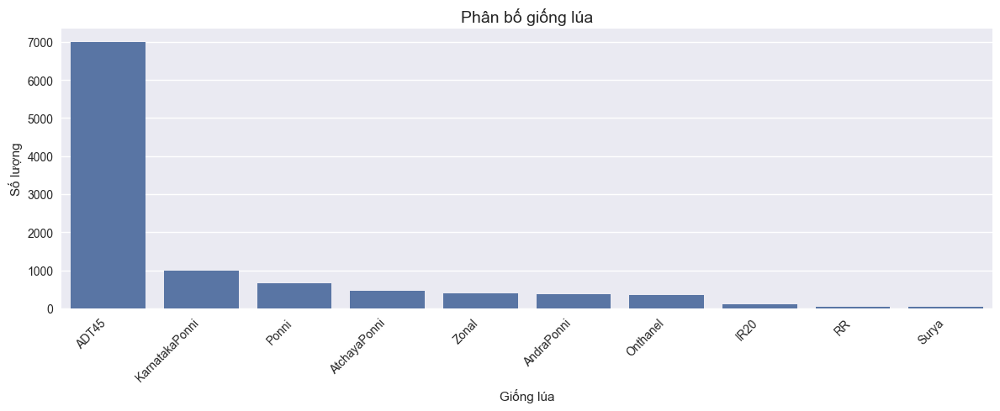

In [5]:
# 3. PHÂN BỐ GIỐNG LÚA

variety_order = df["variety"].value_counts().index

plt.figure(figsize=(12, 5))
sns.countplot(data=df, x="variety", order=variety_order)
plt.title("Phân bố giống lúa", fontsize=14)
plt.xlabel("Giống lúa")
plt.ylabel("Số lượng")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


In [6]:
# Số lượng loại bệnh
num_diseases_vi = df["label_vi"].nunique()
print("\nSố lượng loại bệnh:", num_diseases_vi)

label_counts = df["label_vi"].value_counts().sort_values(ascending=False)
print(f"\nSố lượng ảnh theo từng loại bệnh: {label_counts}\n")


Số lượng loại bệnh: 10

Số lượng ảnh theo từng loại bệnh: label_vi
Lá khỏe mạnh               1764
Bệnh đạo ôn                1738
Bệnh sâu hispa             1594
Bệnh chết tim              1442
Bệnh vàng lùn (Tungro)     1088
Bệnh đốm nâu                965
Bệnh sương mai              620
Bệnh bạc lá (vi khuẩn)      479
Bệnh sọc lá vi khuẩn        380
Bệnh thối bông vi khuẩn     337
Name: count, dtype: int64



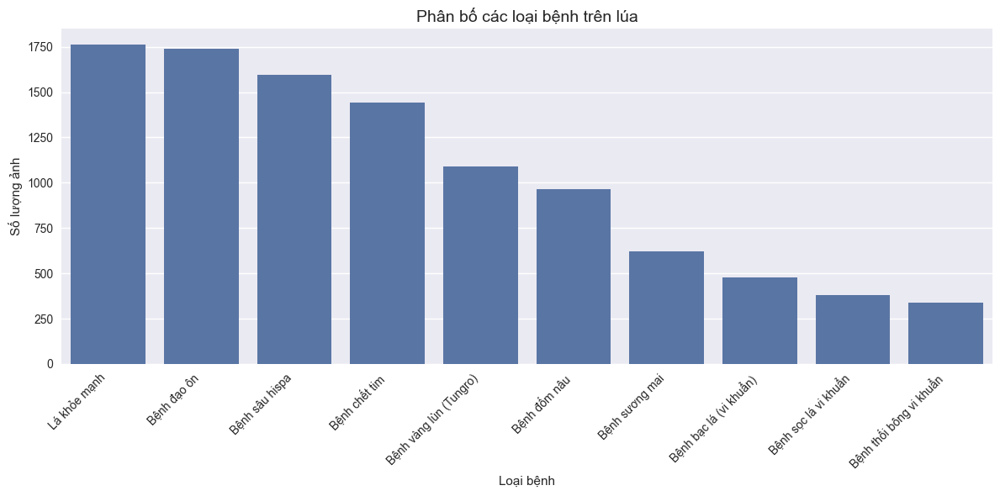

In [7]:
# 2. PHÂN BỐ NHÃN BỆNH (TIẾNG VIỆT)
plt.figure(figsize=(12, 6))
sns.barplot(x=label_counts.index, y=label_counts.values)
plt.title("Phân bố các loại bệnh trên lúa", fontsize=14)
plt.xlabel("Loại bệnh")
plt.ylabel("Số lượng ảnh")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

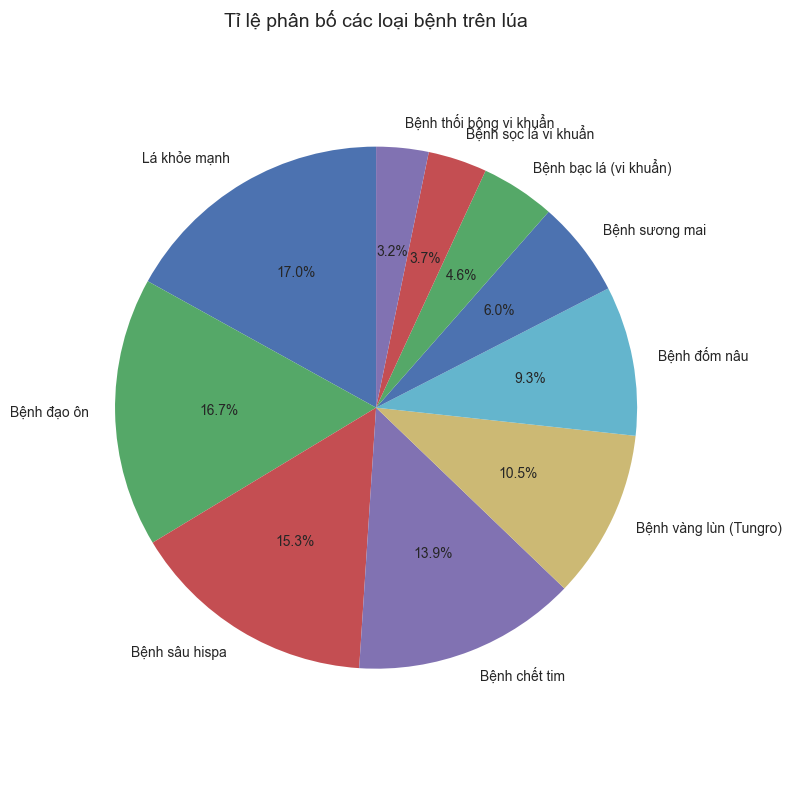

In [8]:
# Biểu đồ tròn - Tỉ lệ các loại bệnh

plt.figure(figsize=(8, 8))
plt.pie(
    label_counts.values,
    labels=label_counts.index,
    autopct="%.1f%%",
    startangle=90
)
plt.title("Tỉ lệ phân bố các loại bệnh trên lúa", fontsize=14)
plt.axis("equal")  # Hình tròn chuẩn
plt.tight_layout()
plt.show()


In [9]:
# 4. THỐNG KÊ TUỔI LÚA THEO BỆNH
age_by_disease = (
    df.groupby("label_vi")["age"]
    .describe()
    .round(2)
)

age_by_disease


,count,mean,std,min,25%,50%,75%,max
label_vi,,,,,,,,
Bệnh bạc lá (vi khuẩn),479.0,60.81,9.65,45.0,55.0,60.0,72.0,72.0
Bệnh chết tim,1442.0,70.00,6.35,50.0,70.0,70.0,75.0,80.0
Bệnh sâu hispa,1594.0,62.10,7.86,45.0,57.0,65.0,70.0,72.0
Bệnh sương mai,620.0,60.32,9.20,45.0,50.0,60.0,70.0,70.0
Bệnh sọc lá vi khuẩn,380.0,62.99,8.69,50.0,55.0,70.0,70.0,77.0
Bệnh thối bông vi khuẩn,337.0,71.85,4.80,65.0,68.0,70.0,75.0,80.0
Bệnh vàng lùn (Tungro),1088.0,63.27,8.20,45.0,60.0,65.0,70.0,72.0
Bệnh đạo ôn,1738.0,63.80,11.27,45.0,50.0,70.0,75.0,77.0
Bệnh đốm nâu,965.0,64.98,8.77,45.0,55.0,70.0,70.0,75.0


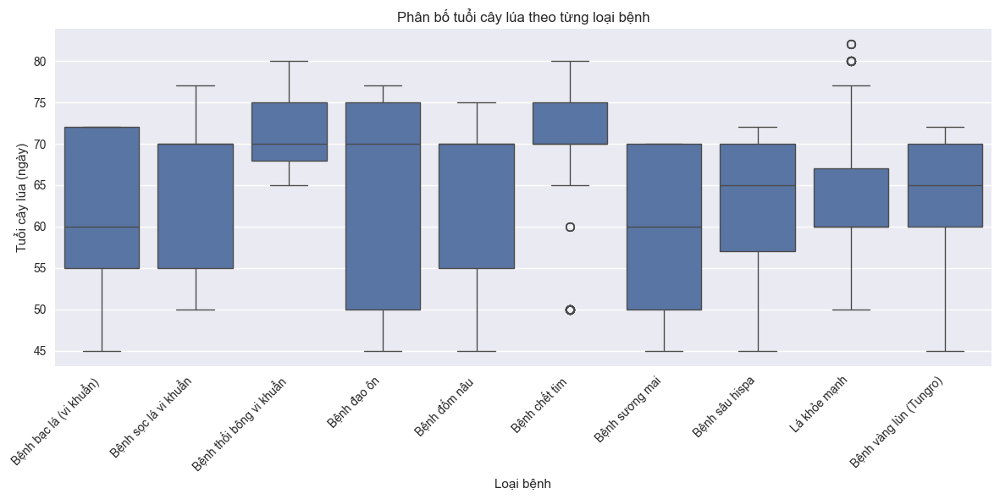

In [10]:
plt.figure(figsize=(12,6))
sns.boxplot(
    data=df,
    x="label_vi",  
    y="age"
)
plt.xticks(rotation=45, ha="right")
plt.title("Phân bố tuổi cây lúa theo từng loại bệnh")
plt.xlabel("Loại bệnh")
plt.ylabel("Tuổi cây lúa (ngày)")
plt.tight_layout()
plt.show()


Phân tích thuộc tính ảnh...

Thống kê kích thước ảnh:
Chiều rộng  - Min: 480, Max: 480, Mean: 480.0
Chiều cao - Min: 640, Max: 640, Mean: 640.0
Channels: {3}


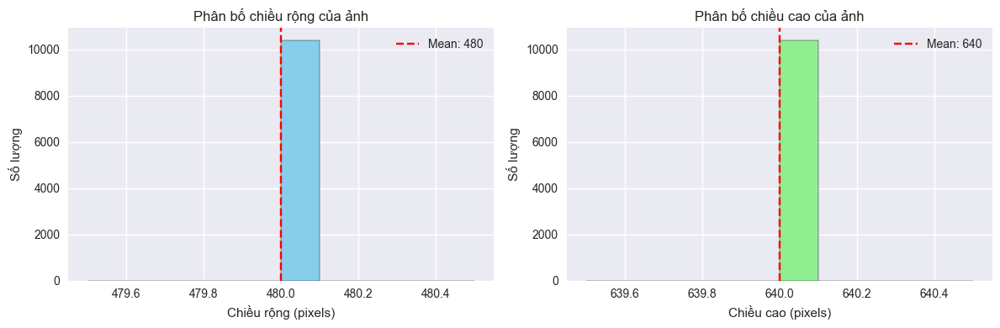

In [11]:
widths = []
heights = []
channels = set()

for label in os.listdir(TRAIN_IMG_DIR):
    label_path = os.path.join(TRAIN_IMG_DIR, label)
    if not os.path.isdir(label_path):
        continue

    for img_name in os.listdir(label_path):
        img_path = os.path.join(label_path, img_name)
        try:
            with Image.open(img_path) as img:
                w, h = img.size
                widths.append(w)
                heights.append(h)
                channels.add(len(img.getbands()))
        except:
            continue

# ---- In thống kê ----
print("Phân tích thuộc tính ảnh...\n")
print("Thống kê kích thước ảnh:")
print(f"Chiều rộng  - Min: {min(widths)}, Max: {max(widths)}, Mean: {sum(widths)/len(widths):.1f}")
print(f"Chiều cao - Min: {min(heights)}, Max: {max(heights)}, Mean: {sum(heights)/len(heights):.1f}")
print(f"Channels: {channels}")

# ---- Vẽ biểu đồ ----
plt.figure(figsize=(12,4))

# Histogram Width
plt.subplot(1,2,1)
plt.hist(widths, bins=10, color='skyblue', edgecolor='black')
plt.axvline(sum(widths)/len(widths), color='red', linestyle='--', label=f"Mean: {sum(widths)/len(widths):.0f}")
plt.title("Phân bố chiều rộng của ảnh")
plt.xlabel("Chiều rộng (pixels)")
plt.ylabel("Số lượng")
plt.legend()

# Histogram Height
plt.subplot(1,2,2)
plt.hist(heights, bins=10, color='lightgreen', edgecolor='black')
plt.axvline(sum(heights)/len(heights), color='red', linestyle='--', label=f"Mean: {sum(heights)/len(heights):.0f}")
plt.title("Phân bố chiều cao của ảnh")
plt.xlabel("Chiều cao (pixels)")
plt.ylabel("Số lượng")
plt.legend()

plt.tight_layout()
plt.show()

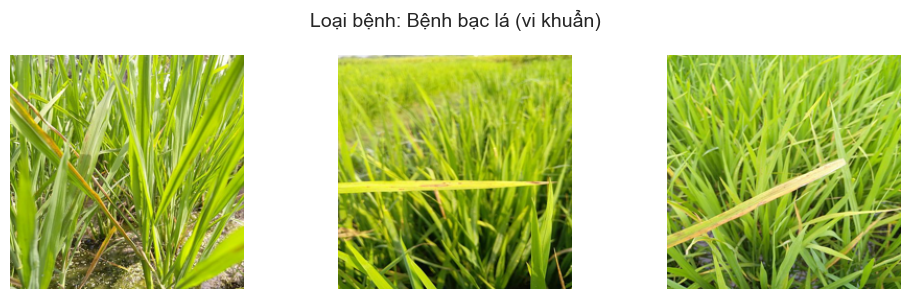

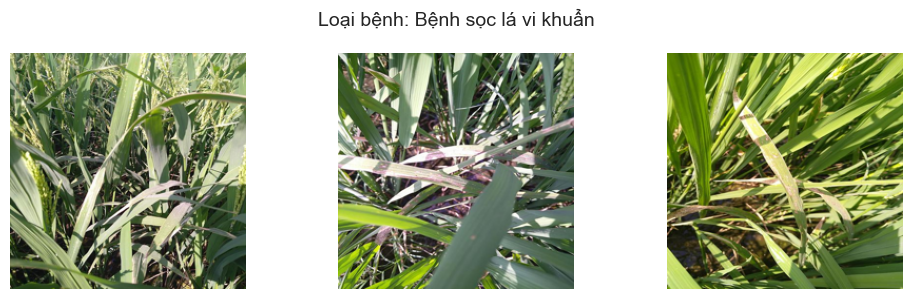

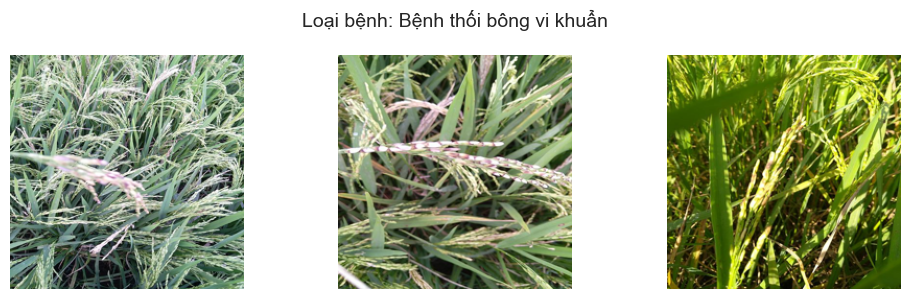

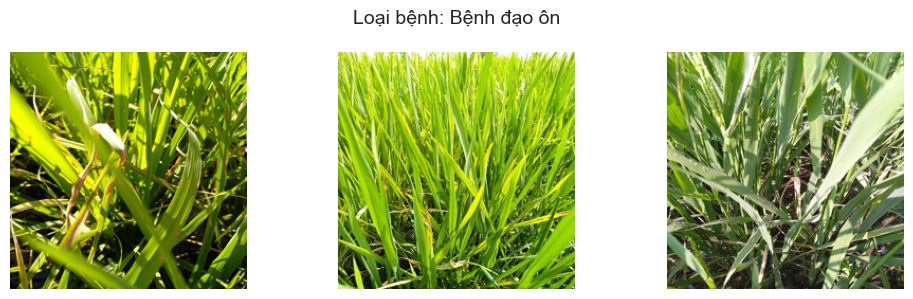

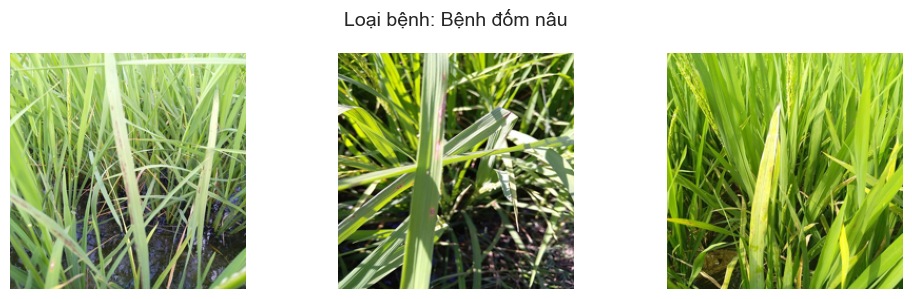

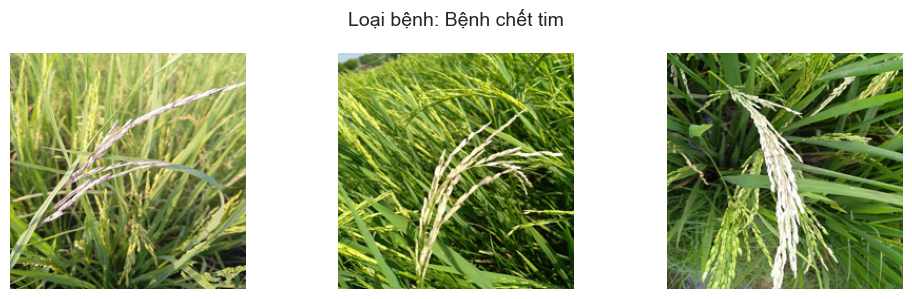

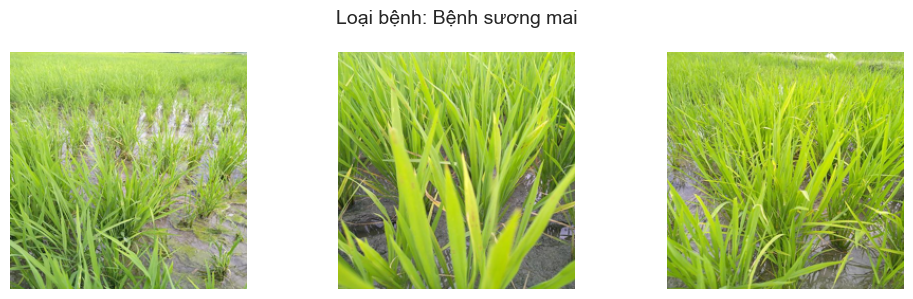

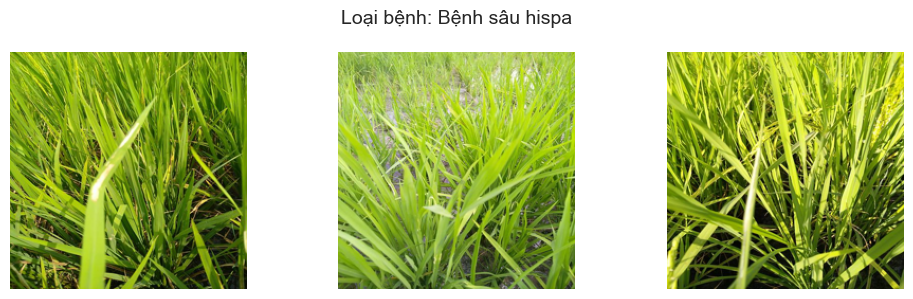

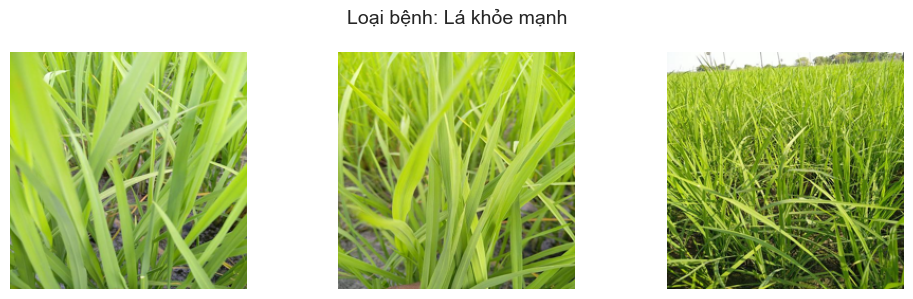

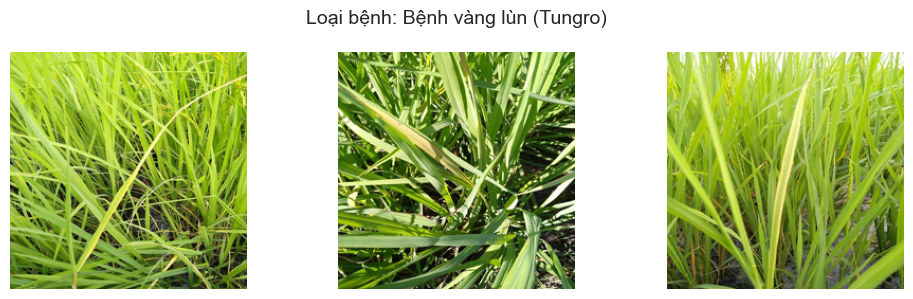

In [12]:
def show_anh_mau_cua_banh(data_dir, label_vi_map, samples_per_class=3, img_size=(224, 224)):
    classes = sorted(os.listdir(data_dir))
    classes = [c for c in classes if os.path.isdir(os.path.join(data_dir, c))]

    for class_name in classes:
        class_path = os.path.join(data_dir, class_name)
        images = os.listdir(class_path)

        # Lấy tên bệnh tiếng Việt từ train.csv
        label_vi = label_vi_map.get(class_name, class_name)

        # Lấy ngẫu nhiên ảnh
        sample_images = random.sample(images, samples_per_class)

        plt.figure(figsize=(10, 3))
        plt.suptitle(f"Loại bệnh: {label_vi}", fontsize=14)

        for i, img_name in enumerate(sample_images):
            img_path = os.path.join(class_path, img_name)
            img = Image.open(img_path).resize(img_size)

            plt.subplot(1, samples_per_class, i + 1)
            plt.imshow(img)
            plt.axis("off")

        plt.tight_layout()
        plt.show()
show_anh_mau_cua_banh(TRAIN_IMG_DIR, label_map, samples_per_class=3, img_size=(224, 224))

Phân tích độ sáng và độ tương phản ảnh...

Độ sáng (Brightness):
Min: 86.31, Max: 195.22, Mean: 132.64

Độ tương phản (Contrast):
Min: 31.35, Max: 76.09, Mean: 56.42



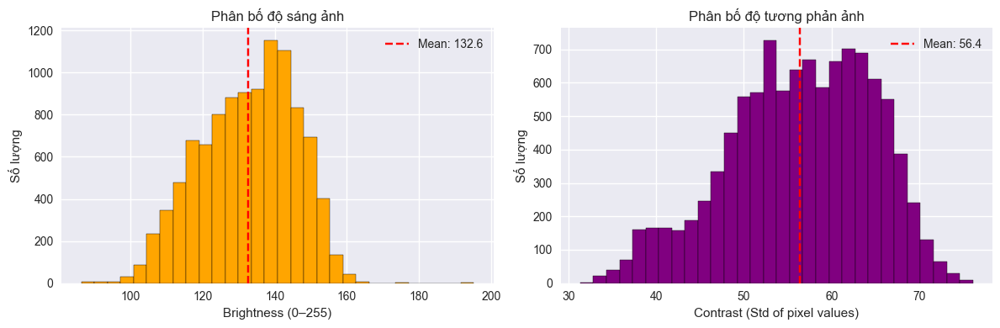

In [13]:

brightness_values = []
contrast_values = []

for label in os.listdir(TRAIN_IMG_DIR):
    label_path = os.path.join(TRAIN_IMG_DIR, label)
    if not os.path.isdir(label_path):
        continue

    for img_name in os.listdir(label_path):
        img_path = os.path.join(label_path, img_name)
        try:
            # Chuyển ảnh sang grayscale để đo sáng & tương phản
            img = Image.open(img_path).convert("L")
            img_array = np.array(img)

            brightness = img_array.mean()      # Độ sáng
            contrast = img_array.std()         # Độ tương phản

            brightness_values.append(brightness)
            contrast_values.append(contrast)
        except:
            continue

# ---- In thống kê ----
print("Phân tích độ sáng và độ tương phản ảnh...\n")

print("Độ sáng (Brightness):")
print(f"Min: {min(brightness_values):.2f}, "
      f"Max: {max(brightness_values):.2f}, "
      f"Mean: {np.mean(brightness_values):.2f}")

print("\nĐộ tương phản (Contrast):")
print(f"Min: {min(contrast_values):.2f}, "
      f"Max: {max(contrast_values):.2f}, "
      f"Mean: {np.mean(contrast_values):.2f}")
print()

# ---- Vẽ biểu đồ ----
plt.figure(figsize=(12,4))

# Brightness
plt.subplot(1,2,1)
plt.hist(brightness_values, bins=30, color='orange', edgecolor='black')
plt.axvline(np.mean(brightness_values), color='red', linestyle='--',
            label=f"Mean: {np.mean(brightness_values):.1f}")
plt.title("Phân bố độ sáng ảnh")
plt.xlabel("Brightness (0–255)")
plt.ylabel("Số lượng")
plt.legend()

# Contrast
plt.subplot(1,2,2)
plt.hist(contrast_values, bins=30, color='purple', edgecolor='black')
plt.axvline(np.mean(contrast_values), color='red', linestyle='--',
            label=f"Mean: {np.mean(contrast_values):.1f}")
plt.title("Phân bố độ tương phản ảnh")
plt.xlabel("Contrast (Std of pixel values)")
plt.ylabel("Số lượng")
plt.legend()

plt.tight_layout()
plt.show()


# Tiền Xử Lý và Tăng Cường Dữ Liệu

In [14]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.utils import class_weight

# =====================================================
# 1. CẤU HÌNH CHUNG
# =====================================================
IMG_SIZE = (224, 224)
BATCH_SIZE = 32  # Giảm xuống 16 nếu GPU yếu

# =====================================================
# 2. TẢI & KIỂM TRA DỮ LIỆU
# =====================================================
df = pd.read_csv(TRAIN_CSV)

# BẮT BUỘC: đảm bảo đã có label_vi
df['label_vi'] = df['label'].map(label_map).fillna(df['label'])
assert 'label_vi' in df.columns, "❌ Chưa tạo cột label_vi"

print("Đã tải train.csv với kích thước:", df.shape)

# =====================================================
# 3. TẠO ĐƯỜNG DẪN ẢNH ĐẦY ĐỦ
# Logic: train_images / tên_thư_mục_bệnh / image_id
# =====================================================
def get_img_path(row):
    return os.path.join(TRAIN_IMG_DIR, row['label'], row['image_id'])

df['image_path'] = df.apply(get_img_path, axis=1)

# =====================================================
# 4. CHIA TRAIN / VALIDATION (THEO label_vi)
# =====================================================
train_df, val_df = train_test_split(
    df,
    test_size=0.2,
    random_state=42,
    stratify=df['label_vi']
)

print(f"Tổng số ảnh: {len(df)}")
print(f"Train set: {len(train_df)} ảnh")
print(f"Validation set: {len(val_df)} ảnh")

# =====================================================
# 5. KHAI BÁO IMAGE DATA GENERATOR
# =====================================================

# Train: Có cường hóa dữ liệu
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Validation: Chỉ chuẩn hóa
val_datagen = ImageDataGenerator(rescale=1./255)

# =====================================================
# 6. TẠO DATA GENERATOR (DÙNG label_vi)
# =====================================================
print("\n--- Đang khởi tạo luồng dữ liệu ---")

BATCH_SIZE = 32 
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col='image_path',
    y_col='label_vi',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True
)

val_generator = val_datagen.flow_from_dataframe(
    dataframe=val_df,
    x_col='image_path',
    y_col='label_vi',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

# =====================================================
# 7. TÍNH CLASS WEIGHT (MAP ĐÚNG VỚI GENERATOR)
# =====================================================

labels = train_df['label_vi'].values

class_weights_val = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(labels),
    y=labels
)

# Mapping chính xác label_vi → index của output neuron
class_indices = train_generator.class_indices

class_weights_dict = {
    class_indices[label]: weight
    for label, weight in zip(np.unique(labels), class_weights_val)
}

print(f"\nClass indices (label_vi → index):{class_indices}Ɵ")


print(f"\nClass weights (đã map đúng):{class_weights_dict}Ɵ")

print("\nĐã hoàn tất tiền xử lý & tăng cường dữ liệu!")


Đã tải train.csv với kích thước: (10407, 5)
Tổng số ảnh: 10407
Train set: 8325 ảnh
Validation set: 2082 ảnh

--- Đang khởi tạo luồng dữ liệu ---
Found 8325 validated image filenames belonging to 10 classes.
Found 2082 validated image filenames belonging to 10 classes.

Class indices (label_vi → index):{'Bệnh bạc lá (vi khuẩn)': 0, 'Bệnh chết tim': 1, 'Bệnh sâu hispa': 2, 'Bệnh sương mai': 3, 'Bệnh sọc lá vi khuẩn': 4, 'Bệnh thối bông vi khuẩn': 5, 'Bệnh vàng lùn (Tungro)': 6, 'Bệnh đạo ôn': 7, 'Bệnh đốm nâu': 8, 'Lá khỏe mạnh': 9}Ɵ

Class weights (đã map đúng):{0: np.float64(2.1736292428198434), 1: np.float64(0.7214038128249567), 2: np.float64(0.6529411764705882), 3: np.float64(1.6784274193548387), 4: np.float64(2.7384868421052633), 5: np.float64(3.0833333333333335), 6: np.float64(0.9568965517241379), 7: np.float64(0.5989208633093526), 8: np.float64(1.0783678756476685), 9: np.float64(0.5900070871722183)}Ɵ

Đã hoàn tất tiền xử lý & tăng cường dữ liệu!


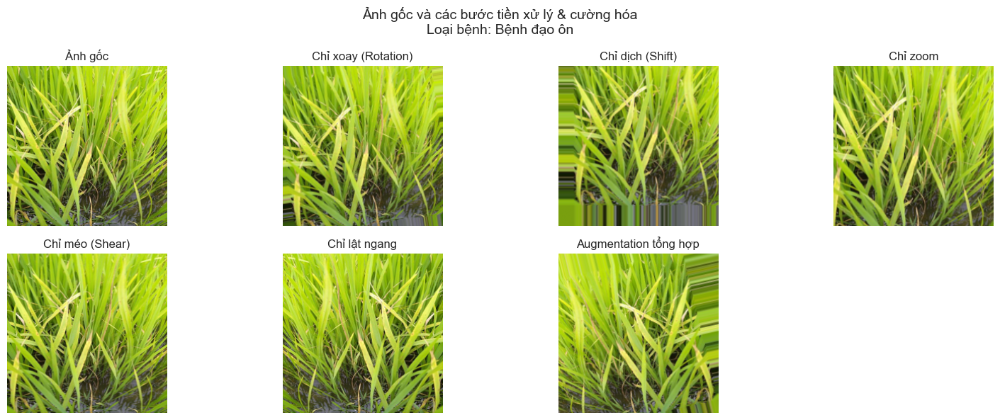

In [15]:
# =====================================================
# Trực quan hóa từng phép tiền xử lý & cường hóa dữ liệu
# =====================================================

# Lấy 1 ảnh mẫu bất kỳ từ tập train
sample_row = train_df.iloc[0]
sample_label_vi = sample_row['label_vi']
sample_img_path = sample_row['image_path']

# Đọc và chuẩn hóa ảnh
img = Image.open(sample_img_path).resize(IMG_SIZE)
img_arr = np.array(img) / 255.0

# -----------------------------------------------------
# Tạo các ImageDataGenerator RIÊNG LẺ cho từng phép
# -----------------------------------------------------
datagen_rotate = ImageDataGenerator(rotation_range=30)
datagen_shift  = ImageDataGenerator(width_shift_range=0.2, height_shift_range=0.2)
datagen_zoom   = ImageDataGenerator(zoom_range=0.3)
datagen_shear  = ImageDataGenerator(shear_range=0.3)
datagen_flip   = ImageDataGenerator(horizontal_flip=True)

# -----------------------------------------------------
# Áp dụng từng phép biến đổi
# -----------------------------------------------------
img_rotate = datagen_rotate.random_transform(img_arr)
img_shift  = datagen_shift.random_transform(img_arr)
img_zoom   = datagen_zoom.random_transform(img_arr)
img_shear  = datagen_shear.random_transform(img_arr)
img_flip   = datagen_flip.random_transform(img_arr)

# -----------------------------------------------------
# Áp dụng augmentation tổng hợp (giống khi train)
# -----------------------------------------------------
img_full_aug = train_datagen.random_transform(img_arr)

# -----------------------------------------------------
# HIỂN THỊ KẾT QUẢ
# -----------------------------------------------------
plt.figure(figsize=(16, 6))

images = [
    img_arr,
    img_rotate,
    img_shift,
    img_zoom,
    img_shear,
    img_flip,
    img_full_aug
]

titles = [
    "Ảnh gốc",
    "Chỉ xoay (Rotation)",
    "Chỉ dịch (Shift)",
    "Chỉ zoom",
    "Chỉ méo (Shear)",
    "Chỉ lật ngang",
    "Augmentation tổng hợp"
]

for i, (im, title) in enumerate(zip(images, titles)):
    plt.subplot(2, 4, i + 1)
    plt.imshow(im)
    plt.title(title)
    plt.axis("off")

plt.suptitle(
    f"Ảnh gốc và các bước tiền xử lý & cường hóa\nLoại bệnh: {sample_label_vi}",
    fontsize=14
)

plt.tight_layout()
plt.show()


# Mô Hình CNN

In [16]:

from tensorflow.keras import layers, models, regularizers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint


def build_monster_cnn(input_shape=(224, 224, 3), num_classes=10):
    inputs = layers.Input(shape=input_shape)
    
    # --- BLOCK 1 ---
    x = layers.Conv2D(32, (3, 3), padding='same', activation='relu')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(32, (3, 3), padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2))(x)
    
    # --- BLOCK 2 ---
    x = layers.Conv2D(64, (3, 3), padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(64, (3, 3), padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Dropout(0.2)(x)
    
    # --- BLOCK 3 ---
    x = layers.Conv2D(128, (3, 3), padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(128, (3, 3), padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Dropout(0.3)(x)
    
    # --- BLOCK 4 ---
    x = layers.Conv2D(256, (3, 3), padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(256, (3, 3), padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Dropout(0.4)(x)

    # --- HEAD ---
    x = layers.GlobalAveragePooling2D()(x)
    
    x = layers.Dense(
        4096, activation='relu',
        kernel_regularizer=regularizers.l2(0.001)
    )(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.6)(x)
    
    x = layers.Dense(
        1024, activation='relu',
        kernel_regularizer=regularizers.l2(0.001)
    )(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    
    outputs = layers.Dense(num_classes, activation='softmax')(x)
    
    model = models.Model(inputs=inputs, outputs=outputs, name="Monster_Paddy_CNN")
    return model
print("Đã định nghĩa hàm xây dựng mô hình Monster CNN.")

Đã định nghĩa hàm xây dựng mô hình Monster CNN.


In [17]:
# -----------------------------------------------------
# 2. COMPILE MODEL
# -----------------------------------------------------
model = build_monster_cnn()

model.compile(
    optimizer=Adam(learning_rate=1e-3),  
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()


# -----------------------------------------------------
# 3. CALLBACKS (TỰ ĐỘNG ĐIỀU KHIỂN)
# -----------------------------------------------------
callbacks = [
    ModelCheckpoint(
        filepath="monster_cnn_best.keras",
        monitor="val_loss",
        save_best_only=True,
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.2,
        patience=5,
        min_lr=1e-6,
        verbose=1
    ),
    EarlyStopping(
        monitor="val_loss",
        patience=10,
        restore_best_weights=True,
        verbose=1
    )
]
print("Đã thiết lập các callbacks.")

Model: "Monster_Paddy_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 224, 224, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 112, 112, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 56, 56, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 28, 28, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 6,454,826 (24.62 MB)

 Trainable params: 6,442,666 (24.58 MB)

 Non-trainable params: 12,160 (47.50 KB)

Đã thiết lập các callbacks.


In [18]:
# -----------------------------------------------------
# 4. TRAIN MODEL (CÓ CÂN BẰNG TRỌNG SỐ)
# -----------------------------------------------------
EPOCHS = 100

print(" Bắt đầu huấn luyện Monster CNN...")

history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=EPOCHS,
    class_weight=class_weights_dict,  
    callbacks=callbacks
)

print(" Huấn luyện hoàn tất")

 Bắt đầu huấn luyện Monster CNN...


c:\Users\Nguyen Duc Huy\AppData\Local\Programs\Python\Python313\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/100
261/261 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.1496 - loss: 5.3456
Epoch 1: val_loss improved from None to 7.00081, saving model to monster_cnn_best.keras
261/261 ━━━━━━━━━━━━━━━━━━━━ 722s 3s/step - accuracy: 0.1596 - loss: 5.0583 - val_accuracy: 0.1527 - val_loss: 7.0008 - learning_rate: 0.0010
Epoch 2/100
261/261 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.2216 - loss: 4.4261
Epoch 2: val_loss improved from 7.00081 to 4.26684, saving model to monster_cnn_best.keras
261/261 ━━━━━━━━━━━━━━━━━━━━ 736s 3s/step - accuracy: 0.2294 - loss: 4.2343 - val_accuracy: 0.1715 - val_loss: 4.2668 - learning_rate: 0.0010
Epoch 3/100
261/261 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.2531 - loss: 3.8545
Epoch 3: val_loss did not improve from 4.26684
261/261 ━━━━━━━━━━━━━━━━━━━━ 763s 3s/step - accuracy: 0.2735 - loss: 3.6994 - val_accuracy: 0.1542 - val_loss: 5.9156 - learning_rate: 0.0010
Epoch 4/100
261/261 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.2896 - loss: 3.4466
Epoc

In [19]:

import tensorflow as tf

best_model = tf.keras.models.load_model("monster_cnn_best.keras")

print("Đã load mô hình tốt nhất:")
best_model.summary()


Đã load mô hình tốt nhất:


Model: "Monster_Paddy_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 224, 224, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 112, 112, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 56, 56, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 28, 28, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 19,340,160 (73.78 MB)

 Trainable params: 6,442,666 (24.58 MB)

 Non-trainable params: 12,160 (47.50 KB)

 Optimizer params: 12,885,334 (49.15 MB)

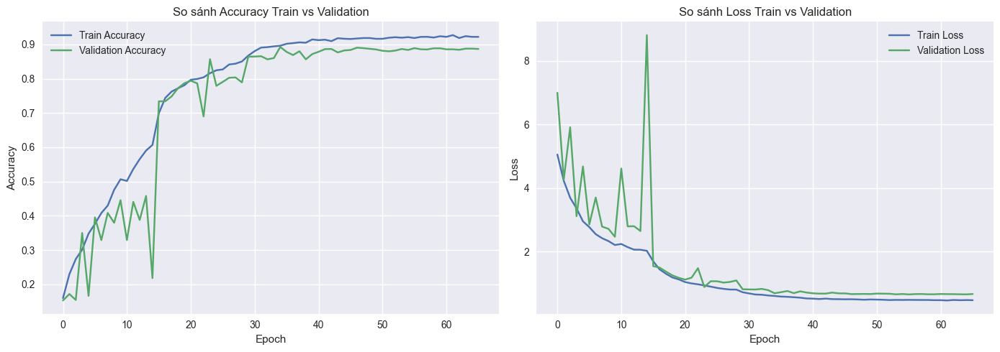

In [20]:

# BIỂU ĐỒ SO SÁNH TRAIN vs VALIDATION

plt.figure(figsize=(14, 5))

# --- Accuracy ---
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('So sánh Accuracy Train vs Validation')
plt.legend()
plt.grid(True)

# --- Loss ---
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('So sánh Loss Train vs Validation')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


In [21]:

# 1. DỰ ĐOÁN TRÊN TẬP VALIDATION


# Reset generator để đảm bảo thứ tự đúng
val_generator.reset()

# Nhãn thật
y_true = val_generator.classes

# Dự đoán
y_pred_prob = best_model.predict(val_generator)
y_pred = np.argmax(y_pred_prob, axis=1)

# Tên các lớp (theo label_vi)
class_names = list(val_generator.class_indices.keys())

print("Số mẫu validation:", len(y_true))
print("Số lớp:", len(class_names))


66/66 ━━━━━━━━━━━━━━━━━━━━ 31s 467ms/step
Số mẫu validation: 2082
Số lớp: 10


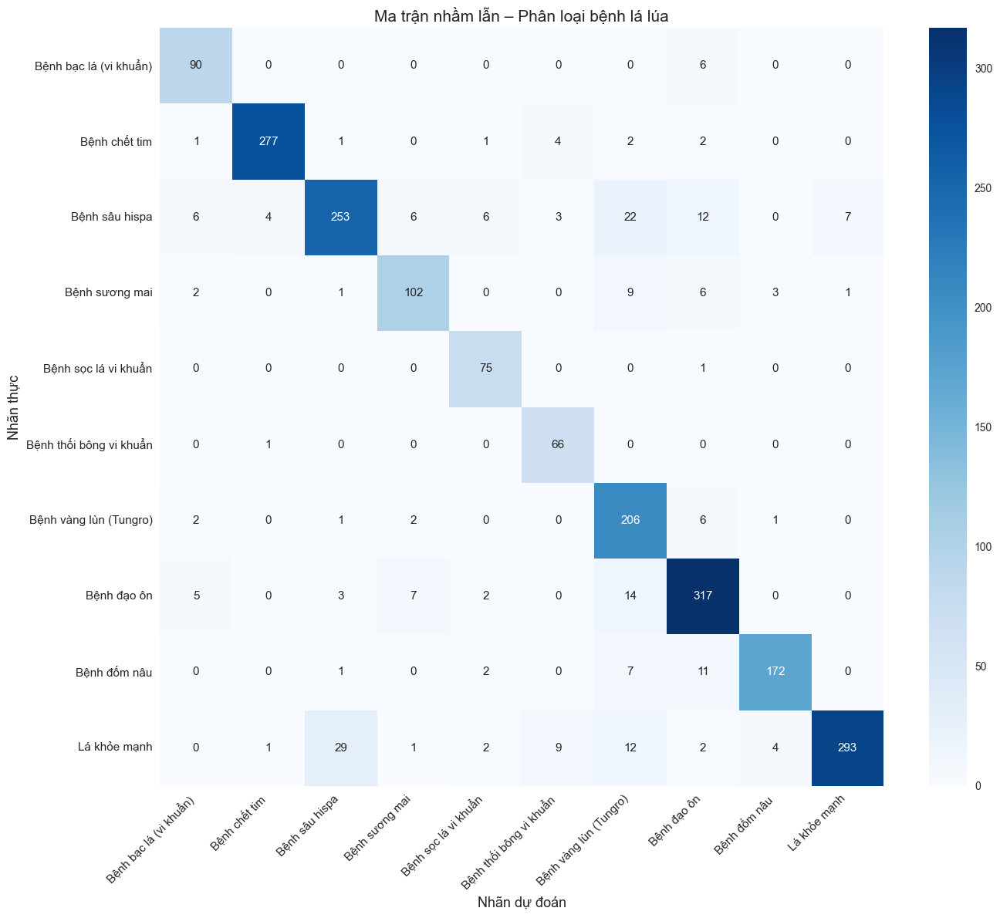

In [22]:

from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(14, 12))  # TO hơn để đọc rõ

sns.heatmap(
    cm,
    annot=True,                # Hiện số trong ô
    fmt="d",                   # Số nguyên
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names,
    annot_kws={"size": 11}     # Cỡ chữ số trong ô
)

plt.xlabel("Nhãn dự đoán", fontsize=13)
plt.ylabel("Nhãn thực", fontsize=13)
plt.title("Ma trận nhầm lẫn – Phân loại bệnh lá lúa", fontsize=15)

plt.xticks(rotation=45, ha="right", fontsize=11)
plt.yticks(rotation=0, fontsize=11)

plt.tight_layout()
plt.show()


In [23]:

# BÁO CÁO PRECISION – RECALL – F1-SCORE


from sklearn.metrics import classification_report

report = classification_report(
    y_true,
    y_pred,
    target_names=class_names,
    digits=4
)

print("BÁO CÁO PHÂN LOẠI CHI TIẾT:\n")
print(report)


BÁO CÁO PHÂN LOẠI CHI TIẾT:

                         precision    recall  f1-score   support

 Bệnh bạc lá (vi khuẩn)     0.8491    0.9375    0.8911        96
          Bệnh chết tim     0.9788    0.9618    0.9702       288
         Bệnh sâu hispa     0.8754    0.7931    0.8322       319
         Bệnh sương mai     0.8644    0.8226    0.8430       124
   Bệnh sọc lá vi khuẩn     0.8523    0.9868    0.9146        76
Bệnh thối bông vi khuẩn     0.8049    0.9851    0.8859        67
 Bệnh vàng lùn (Tungro)     0.7574    0.9450    0.8408       218
            Bệnh đạo ôn     0.8733    0.9109    0.8917       348
           Bệnh đốm nâu     0.9556    0.8912    0.9223       193
           Lá khỏe mạnh     0.9734    0.8300    0.8960       353

               accuracy                         0.8890      2082
              macro avg     0.8784    0.9064    0.8888      2082
           weighted avg     0.8961    0.8890    0.8894      2082



In [24]:

# ĐỘ CHÍNH XÁC THEO TỪNG LOẠI BỆNH


print("ĐỘ CHÍNH XÁC THEO TỪNG LOẠI BỆNH\n")

# Tính accuracy cho từng lớp: đúng / tổng số mẫu thật
per_class_accuracy = cm.diagonal() / cm.sum(axis=1)

# In kết quả
for i, acc in enumerate(per_class_accuracy):
    print(f"{class_names[i]:25s} : {acc*100:.2f}%")


ĐỘ CHÍNH XÁC THEO TỪNG LOẠI BỆNH

Bệnh bạc lá (vi khuẩn)    : 93.75%
Bệnh chết tim             : 96.18%
Bệnh sâu hispa            : 79.31%
Bệnh sương mai            : 82.26%
Bệnh sọc lá vi khuẩn      : 98.68%
Bệnh thối bông vi khuẩn   : 98.51%
Bệnh vàng lùn (Tungro)    : 94.50%
Bệnh đạo ôn               : 91.09%
Bệnh đốm nâu              : 89.12%
Lá khỏe mạnh              : 83.00%


THỐNG KÊ ẢNH DỰ ĐOÁN ĐÚNG

Tổng số ảnh validation : 2082
Số ảnh dự đoán đúng    : 1851


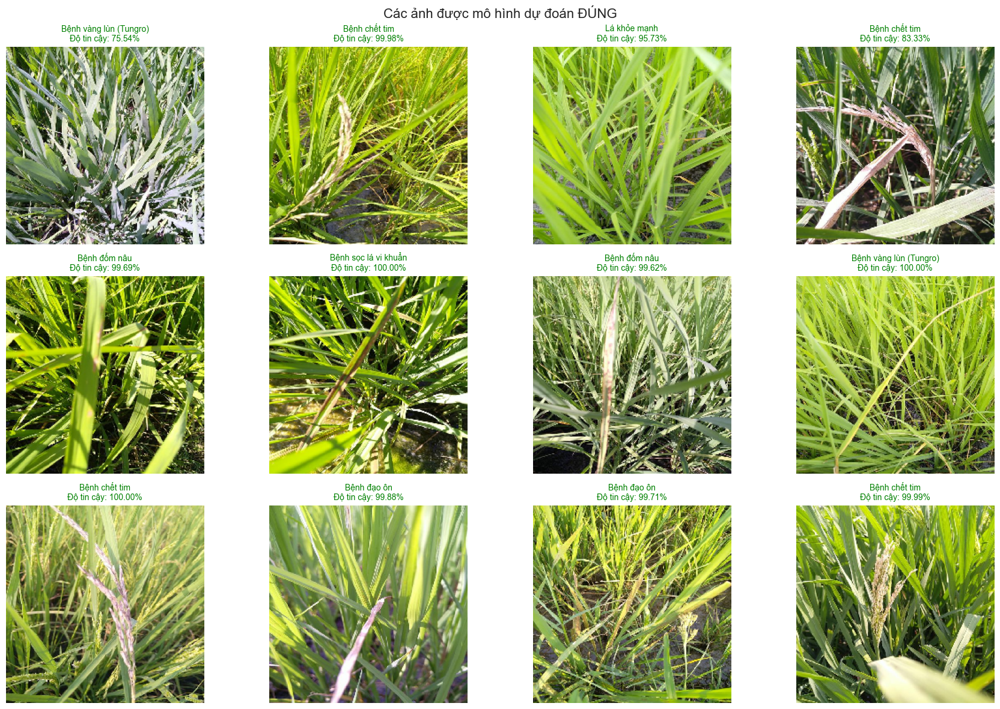

In [25]:

# CELL: HIỂN THỊ ẢNH DỰ ĐOÁN ĐÚNG


import random
from tensorflow.keras.preprocessing.image import load_img, img_to_array


# 1. LỌC CÁC ẢNH DỰ ĐOÁN ĐÚNG

correct_idx = np.where(y_true == y_pred)[0]


print("THỐNG KÊ ẢNH DỰ ĐOÁN ĐÚNG\n")

print(f"Tổng số ảnh validation : {len(y_true)}")
print(f"Số ảnh dự đoán đúng    : {len(correct_idx)}")



# 2. CHỌN NGẪU NHIÊN MỘT SỐ ẢNH ĐÚNG

NUM_IMAGES = 12  # số ảnh muốn hiển thị

sample_idx = random.sample(
    list(correct_idx),
    min(NUM_IMAGES, len(correct_idx))
)

plt.figure(figsize=(18, 12))

for i, idx in enumerate(sample_idx):
    img = load_img(val_generator.filepaths[idx], target_size=(224, 224))
    img_arr = img_to_array(img) / 255.0

    probs = y_pred_prob[idx]
    pred_class = np.argmax(probs)
    confidence = probs[pred_class] * 100
    true_class = y_true[idx]

    plt.subplot(3, 4, i + 1)
    plt.imshow(img_arr)
    plt.axis("off")

    plt.title(
        f"{class_names[true_class]}\n"
        f"Độ tin cậy: {confidence:.2f}%",
        color="green",
        fontsize=10
    )

plt.suptitle("Các ảnh được mô hình dự đoán ĐÚNG", fontsize=16)
plt.tight_layout()
plt.show()


THỐNG KÊ ẢNH DỰ ĐOÁN SAI

Tổng số ảnh validation : 2082
Số ảnh dự đoán sai     : 231
Tỷ lệ dự đoán sai      : 11.10%


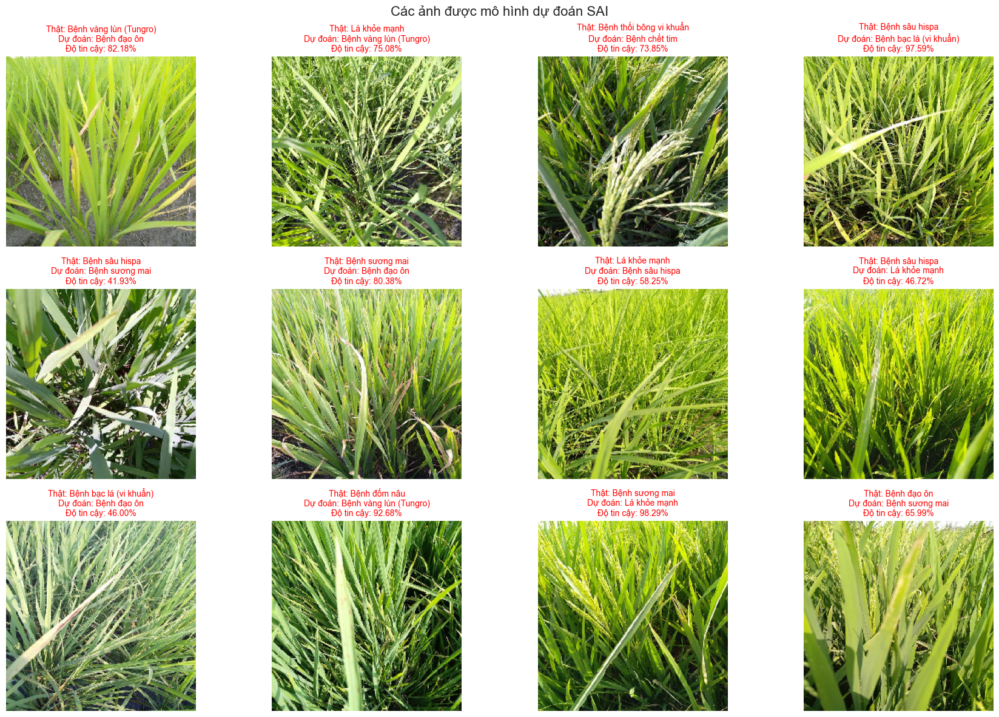

In [26]:

# CELL: HIỂN THỊ ẢNH DỰ ĐOÁN SAI


import random
from tensorflow.keras.preprocessing.image import load_img, img_to_array


# 1. LỌC CÁC ẢNH DỰ ĐOÁN SAI

wrong_idx = np.where(y_true != y_pred)[0]


print("THỐNG KÊ ẢNH DỰ ĐOÁN SAI\n")

print(f"Tổng số ảnh validation : {len(y_true)}")
print(f"Số ảnh dự đoán sai     : {len(wrong_idx)}")
print(f"Tỷ lệ dự đoán sai      : {len(wrong_idx)/len(y_true)*100:.2f}%")



# 2. CHỌN NGẪU NHIÊN MỘT SỐ ẢNH SAI

NUM_IMAGES = 12  # số ảnh muốn hiển thị

sample_idx = random.sample(
    list(wrong_idx),
    min(NUM_IMAGES, len(wrong_idx))
)

plt.figure(figsize=(18, 12))

for i, idx in enumerate(sample_idx):
    img = load_img(val_generator.filepaths[idx], target_size=(224, 224))
    img_arr = img_to_array(img) / 255.0

    probs = y_pred_prob[idx]
    pred_class = np.argmax(probs)
    confidence = probs[pred_class] * 100
    true_class = y_true[idx]

    plt.subplot(3, 4, i + 1)
    plt.imshow(img_arr)
    plt.axis("off")

    plt.title(
        f"Thật: {class_names[true_class]}\n"
        f"Dự đoán: {class_names[pred_class]}\n"
        f"Độ tin cậy: {confidence:.2f}%",
        color="red",
        fontsize=10
    )

plt.suptitle("Các ảnh được mô hình dự đoán SAI", fontsize=16)
plt.tight_layout()
plt.show()


In [27]:

# CHỌN FILE ẢNH & DỰ ĐOÁN BỆNH LÁ LÚA

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import ipywidgets as widgets
from IPython.display import display, clear_output
from io import BytesIO
from PIL import Image

# --- LOAD MODEL ---
MODEL_PATH = "monster_cnn_best.keras"
model = load_model(MODEL_PATH)

IMG_SIZE = (224, 224)

# Mapping label index -> label_vi
class_indices = train_generator.class_indices
idx_to_class = {v: k for k, v in class_indices.items()}

# --- HÀM DỰ ĐOÁN ---
def predict_uploaded_image(img_pil):
    img = img_pil.resize(IMG_SIZE)
    img_arr = np.array(img) / 255.0
    img_arr = np.expand_dims(img_arr, axis=0)

    preds = model.predict(img_arr)[0]
    pred_idx = np.argmax(preds)
    pred_label = idx_to_class[pred_idx]
    confidence = preds[pred_idx] * 100

    # Hiển thị ảnh
    plt.figure(figsize=(4,4))
    plt.imshow(img)
    plt.axis("off")
    plt.title(
        f"Dự đoán: {pred_label}\nĐộ tin cậy: {confidence:.2f}%",
        fontsize=12
    )
    plt.show()

    # Bảng xác suất
    df_prob = pd.DataFrame({
        "Loại bệnh": [idx_to_class[i] for i in range(len(preds))],
        "Xác suất (%)": preds * 100
    }).sort_values("Xác suất (%)", ascending=False)

    display(df_prob.style.format({"Xác suất (%)": "{:.2f}"}))

# --- WIDGET UPLOAD ---
uploader = widgets.FileUpload(
    accept="image/*",
    multiple=False
)

def on_upload_change(change):
    clear_output(wait=True)
    display(uploader)

    uploaded_file = uploader.value[0]
    img_bytes = uploaded_file['content']
    img = Image.open(BytesIO(img_bytes)).convert("RGB")

    predict_uploaded_image(img)

uploader.observe(on_upload_change, names="value")

display(uploader)


ModuleNotFoundError: No module named 'ipywidgets'

# XÂY DỰNG EfficientNetB1

In [ ]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.efficientnet import EfficientNetB1, preprocess_input
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from sklearn.model_selection import train_test_split
from sklearn.utils import class_weight


2026-01-01 13:29:10.710638: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2026-01-01 13:29:10.710731: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2026-01-01 13:29:10.711947: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2026-01-01 13:29:10.718629: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2026-01-01 13:29:11.627562: W tensorflow/compiler/tf2

In [ ]:
# Đường dẫn (giữ như bài của bạn)
TRAIN_CSV = "../train.csv"
TRAIN_IMG_DIR = "../train_images"


df = pd.read_csv(TRAIN_CSV)

# Map label_vi (bắt buộc thống nhất toàn bài)
df["label_vi"] = df["label"].map(label_map).fillna(df["label"])

print("Kích thước dataset:", df.shape)
print("Số lớp:", df["label_vi"].nunique())


Kích thước dataset: (10407, 5)
Số lớp: 10


In [ ]:
def get_img_path(row):
    return os.path.join(TRAIN_IMG_DIR, row["label"], row["image_id"])

df["image_path"] = df.apply(get_img_path, axis=1)

assert df["image_path"].apply(os.path.exists).all(), "❌ Có ảnh không tồn tại"
print("✅ Đã kiểm tra đường dẫn ảnh")


✅ Đã kiểm tra đường dẫn ảnh


In [ ]:
train_df, val_df = train_test_split(
    df,
    test_size=0.2,
    random_state=42,
    stratify=df["label_vi"]
)

print("Train:", len(train_df))
print("Validation:", len(val_df))


Train: 8325
Validation: 2082


In [ ]:
IMG_SIZE = (240, 240)
BATCH_SIZE = 8

train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode="nearest"
)

val_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col="image_path",
    y_col="label_vi",
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=True
)

val_generator = val_datagen.flow_from_dataframe(
    dataframe=val_df,
    x_col="image_path",
    y_col="label_vi",
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=False
)

NUM_CLASSES = len(train_generator.class_indices)
print("Số lớp:", NUM_CLASSES)


Found 8325 validated image filenames belonging to 10 classes.
Found 2082 validated image filenames belonging to 10 classes.
Số lớp: 10


In [ ]:
labels = train_df["label_vi"].values

weights = class_weight.compute_class_weight(
    class_weight="balanced",
    classes=np.unique(labels),
    y=labels
)

class_weights_dict = {
    train_generator.class_indices[label]: w
    for label, w in zip(np.unique(labels), weights)
}

print("Class weights đã sẵn sàng")


Class weights đã sẵn sàng


In [ ]:
base_model = EfficientNetB1(
    weights="imagenet",
    include_top=False,
    input_shape=(240, 240, 3)
)

# MỞ TOÀN BỘ BACKBONE NGAY TỪ ĐẦU
base_model.trainable = True

inputs = layers.Input(shape=(240, 240, 3))
x = base_model(inputs)
x = layers.GlobalAveragePooling2D()(x)
x = layers.BatchNormalization()(x)

x = layers.Dense(512, activation="relu")(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.5)(x)

outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)

model = models.Model(inputs, outputs, name="EfficientNetB1_Paddy")

model.summary()


Model: "EfficientNetB1_Paddy"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 240, 240, 3)]     0         
                                                                 
 efficientnetb1 (Functional  (None, 8, 8, 1280)        6575239   
 )                                                               
                                                                 
 global_average_pooling2d_1  (None, 1280)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 batch_normalization_2 (Bat  (None, 1280)              5120      
 chNormalization)                                                
                                                                 
 dense_2 (Dense)             (None, 512)               655872    
                                              

In [ ]:
callbacks = [
    ModelCheckpoint(
        "efnet_b1_best.keras",
        monitor="val_loss",
        save_best_only=True,
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.3,
        patience=5,
        min_lr=1e-7,
        verbose=1
    ),
    EarlyStopping(
        monitor="val_loss",
        patience=12,
        restore_best_weights=True,
        verbose=1
    )
]



In [ ]:
from tensorflow.keras.optimizers import Adam

print("🔧 Compile EfficientNetB1 (FULL TRAINING)")

model.compile(
    optimizer=Adam(learning_rate=1e-4),  # LR an toàn cho train full
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)


🔧 Compile EfficientNetB1 (FULL TRAINING)


In [ ]:
EPOCHS = 100

print("\nBẮT ĐẦU HUẤN LUYỆN EFFICIENTNETB1... \n")

history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=EPOCHS,
    class_weight=class_weights_dict,
    callbacks=callbacks
)

print("\nHUẤN LUYỆN HOÀN TẤT")



BẮT ĐẦU HUẤN LUYỆN EFFICIENTNETB1... 

Epoch 1/100


2026-01-01 13:33:23.325087: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inEfficientNetB1_Paddy/efficientnetb1/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2026-01-01 13:33:27.164825: I external/local_xla/xla/service/service.cc:168] XLA service 0x5e91971360b0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2026-01-01 13:33:27.164883: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): Quadro T2000, Compute Capability 7.5
2026-01-01 13:33:27.190862: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1767249207.326877    2267 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1039/1041 [============================>.] - ETA: 0s - loss: 2.3503 - accuracy: 0.3288
Epoch 1: val_loss improved from inf to 1.22513, saving model to efnet_b1_best.keras
1041/1041 [==============================] - 400s 341ms/step - loss: 2.3474 - accuracy: 0.3296 - val_loss: 1.2251 - val_accuracy: 0.6383 - lr: 1.0000e-04
Epoch 2/100
1041/1041 [==============================] - ETA: 0s - loss: 1.4732 - accuracy: 0.5416
Epoch 2: val_loss improved from 1.22513 to 0.77792, saving model to efnet_b1_best.keras
1041/1041 [==============================] - 340s 326ms/step - loss: 1.4732 - accuracy: 0.5416 - val_loss: 0.7779 - val_accuracy: 0.7579 - lr: 1.0000e-04
Epoch 3/100
1041/1041 [==============================] - ETA: 0s - loss: 1.0607 - accuracy: 0.6506
Epoch 3: val_loss improved from 0.77792 to 0.69495, saving model to efnet_b1_best.keras
1041/1041 [==============================] - 311s 298ms/step - loss: 1.0607 - accuracy: 0.6506 - val_loss: 0.6949 - val_accuracy: 0.7925 - lr: 1.00

In [ ]:
from tensorflow.keras.models import load_model

best_model = load_model("efnet_b1_best.keras")
print(" Đã load model tốt nhất")


✅ Đã load model tốt nhất


# SO SÁNH MÔ HÌNH CNN & EFFICIENTNETB1

## So sánh tổng quan 2 mô hình

In [ ]:
cnn_model = best_model          # CNN tự xây dựng (đã train xong)
efnet_model = model_efnet_b1    # EfficientNetB1


In [ ]:
import pandas as pd

def model_overview(model, model_name):
    return {
        "Mô hình": model_name,
        "Tổng số tham số": model.count_params(),
        "Tham số huấn luyện": sum([w.numpy().size for w in model.trainable_weights]),
        "Tham số không huấn luyện": sum([w.numpy().size for w in model.non_trainable_weights])
    }

overview = pd.DataFrame([
    model_overview(cnn_model, "CNN"),
    model_overview(efnet_model, "EfficientNetB1")
])

display(overview)


,Mô hình,Tổng số tham số,Tham số huấn luyện,Tham số không huấn luyện
0,CNN,6454826,6442666,12160
1,EfficientNetB1,7243409,664586,6578823


## ĐÁNH GIÁ HIỆU NĂNG (ACCURACY, PRECISION, RECALL, F1)

In [ ]:
from sklearn.metrics import classification_report, accuracy_score
import numpy as np

def evaluate_model(model, generator, model_name):
    generator.reset()
    y_true = generator.classes
    y_pred_prob = model.predict(generator)
    y_pred = np.argmax(y_pred_prob, axis=1)

    report = classification_report(
        y_true, y_pred,
        target_names=list(generator.class_indices.keys()),
        output_dict=True
    )

    df_report = pd.DataFrame(report).transpose()
    df_report["Mô hình"] = model_name

    return df_report, accuracy_score(y_true, y_pred)

cnn_report, cnn_acc = evaluate_model(cnn_model, val_generator, "CNN tự xây dựng")
efnet_report, efnet_acc = evaluate_model(efnet_model, val_generator, "EfficientNetB1")

print("Độ chính xác CNN:", cnn_acc)
print("Độ chính xác EfficientNetB1:", efnet_acc)


66/66 [==============================] - 25s 275ms/step


/home/nlmh/tf_env/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/nlmh/tf_env/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/nlmh/tf_env/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


66/66 [==============================] - 22s 283ms/step
Độ chính xác CNN: 0.03218059558117195
Độ chính xác EfficientNetB1: 0.1037463976945245


/home/nlmh/tf_env/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/nlmh/tf_env/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/nlmh/tf_env/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


## BẢNG SO SÁNH METRICS TỔNG QUAN

In [ ]:
# CNN
cnn_loss, cnn_acc = cnn_model.evaluate(val_generator_cnn, verbose=0)

# EfficientNet
efnet_loss, efnet_acc = efnet_model.evaluate(val_generator_eff, verbose=0)

print(f"Accuracy CNN: {cnn_acc:.2f}")
print(f"Accuracy EfficientNetB1: {efnet_acc:.2f}")



Accuracy CNN: 0.90
Accuracy EfficientNetB1: 0.10


In [ ]:
summary_metrics = pd.DataFrame({
    "Mô hình": ["CNN ", "EfficientNetB1"],

    "Accuracy (%)": [
        cnn_acc * 100,
        efnet_acc * 100
    ],

    "Precision trung bình (%)": [
        cnn_report.loc["macro avg", "precision"] * 100,
        efnet_report.loc["macro avg", "precision"] * 100
    ],

    "Recall trung bình (%)": [
        cnn_report.loc["macro avg", "recall"] * 100,
        efnet_report.loc["macro avg", "recall"] * 100
    ],

    "F1-score trung bình (%)": [
        cnn_report.loc["macro avg", "f1-score"] * 100,
        efnet_report.loc["macro avg", "f1-score"] * 100
    ]
})

# Làm đẹp bảng
summary_metrics = summary_metrics.round(2)

summary_metrics


,Mô hình,Accuracy (%),Precision trung bình (%),Recall trung bình (%),F1-score trung bình (%)
0,CNN,90.30,0.32,10.00,0.62
1,EfficientNetB1,10.37,4.83,12.02,4.05


## SO SÁNH KẾT QUẢ DỰ ĐOÁN TRÊN ẢNH

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.efficientnet import preprocess_input

val_datagen_cnn = ImageDataGenerator(rescale=1./255)

val_generator_cnn = val_datagen_cnn.flow_from_dataframe(
    dataframe=val_df,
    x_col="image_path",
    y_col="label_vi",
    target_size=(224, 224),
    batch_size=32,
    class_mode="categorical",
    shuffle=False
)
val_datagen_eff = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

val_generator_eff = val_datagen_eff.flow_from_dataframe(
    dataframe=val_df,
    x_col="image_path",
    y_col="label_vi",
    target_size=(240, 240),
    batch_size=32,
    class_mode="categorical",
    shuffle=False
)


Found 2082 validated image filenames belonging to 10 classes.
Found 2082 validated image filenames belonging to 10 classes.


In [ ]:
import matplotlib.pyplot as plt

def compare_predictions(model1, model2, generator, class_names, n=5):
    generator.reset()
    imgs, labels = next(generator)
    
    pred1 = np.argmax(model1.predict(imgs), axis=1)
    pred2 = np.argmax(model2.predict(imgs), axis=1)
    true = np.argmax(labels, axis=1)

    plt.figure(figsize=(15, 4*n))
    for i in range(n):
        plt.subplot(n, 3, i*3+1)
        plt.imshow(imgs[i])
        plt.title(f"Thực tế: {class_names[true[i]]}")
        plt.axis("off")

        plt.subplot(n, 3, i*3+2)
        plt.imshow(imgs[i])
        plt.title(f"CNN dự đoán: {class_names[pred1[i]]}")
        plt.axis("off")

        plt.subplot(n, 3, i*3+3)
        plt.imshow(imgs[i])
        plt.title(f"EfficientNet dự đoán: {class_names[pred2[i]]}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()
class_names = list(val_generator.class_indices.keys())
compare_predictions(
    cnn_model,
    efnet_model,
    val_generator_cnn,
    val_generator_eff,
    class_names
)



1/1 [==============================] - 3s 3s/step


ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (2,) + inhomogeneous part.